In [1]:
import cv2
import pytesseract
import difflib
import glob
import os
from IPython.display import Image
import matplotlib.pyplot as plt
%matplotlib inline

### Issue with Tesseract in PATH

- I downloaded Tesserac installer [here](https://github.com/UB-Mannheim/tesseract/wiki) via Tesseract at UB Mannheim
- Subsequently, added the folder containing the tesseract.exe file in the PATH but still got PATH error. I uninstall and installed several times but still no avail
- Found a method on [Stack Overflow](https://stackoverflow.com/questions/50951955/pytesseract-tesseractnotfound-error-tesseract-is-not-installed-or-its-not-i) on setting tesseract path directly in the script which worked!

```pytesseract.pytesseract.tesseract_cmd = r'C:\Users\USER\AppData\Local\Programs\Tesseract-OCR\tesseract.exe'```

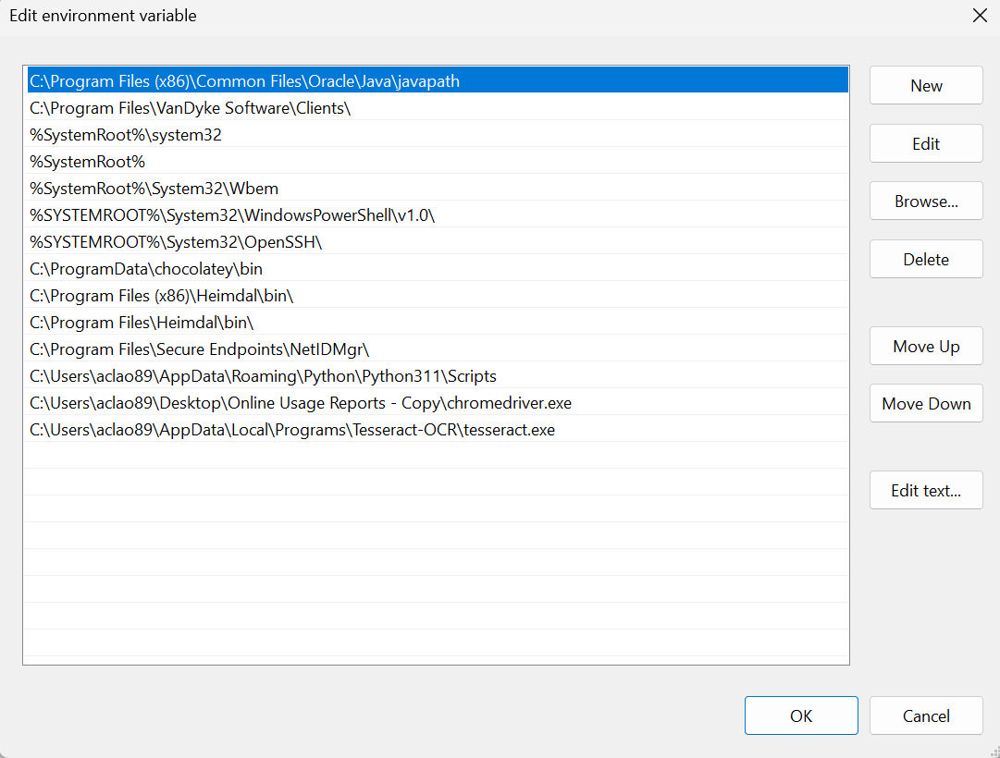

In [10]:
Image(filename='./tesseract PATH.png')

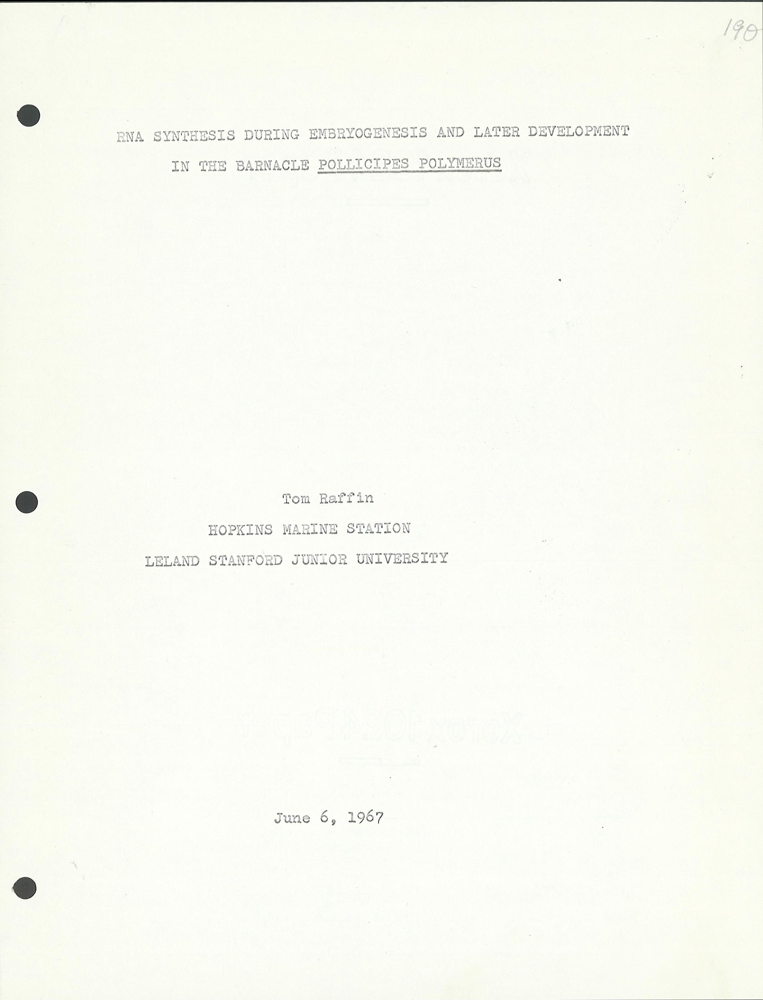

In [6]:
Image(filename='./Fix OCR Papers/bg870mr8040/bg870mr8040_0001.jpg')

##  Reading Images Using OpenCV

OpenCV allows reading different types of images (JPG, PNG, etc). You can load grayscale images, color images or you can also load images with Alpha channel. It uses the cv2.imread() function which has the following syntax:

```image = cv2.imread(filename[,flags]) ```

The function has **1 required input argument** and one optional flag:

filename: This can be an **absolute or relative** path. This is a mandatory argument.

Flags: These flags are used to read an image in a particular format (for example, grayscale/color/with alpha channel). This is an optional argument with a default value of cv2.IMREAD_COLOR or 1 which loads the image as a color image.


**Flags**

- cv2.IMREAD_GRAYSCALE or 0: Loads image in grayscale mode
- cv2.IMREAD_COLOR or 1: Loads a color image. Any transparency of image will be neglected. It is the default flag.
- cv2.IMREAD_UNCHANGED or -1: Loads image as such including alpha channel.

In [3]:
image_example = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0001.jpg")

print("Image size (H, W) is:", image_example.shape)

'''3301 is the height of the image in pixels. 2521 is the width of the image in pixels.
3 denotes that the image has 3 channels. This suggests that the image is a standard RGB (Red, Green, Blue) image, 
where each pixel is represented by a combination of three values corresponding to the intensity of the red, green, and blue channels, respectively. 
Therefore, each pixel in the image requires three values to represent its color information.'''


Image size (H, W) is: (3301, 2521, 3)


'3301 is the height of the image in pixels. 2521 is the width of the image in pixels.\n3 denotes that the image has 3 channels. This suggests that the image is a standard RGB (Red, Green, Blue) image, \nwhere each pixel is represented by a combination of three values corresponding to the intensity of the red, green, and blue channels, respectively. \nTherefore, each pixel in the image requires three values to represent its color information.'

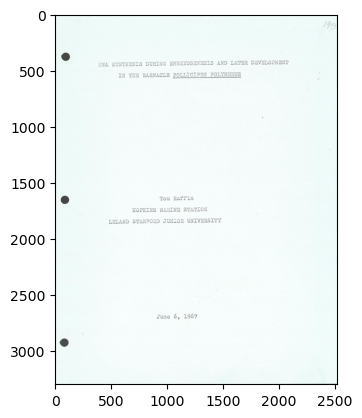

In [4]:
plt.imshow(image_example)

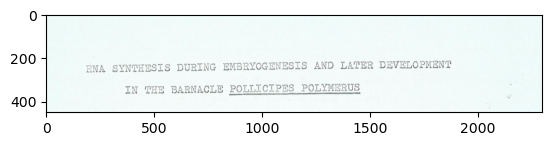

In [5]:
cropped_title = image_example[200:650, 200:2500]
plt.imshow(cropped_title)

## Resizing Images


The function resize resizes the image src down to or up to the specified size. The size and type are derived from the src,dsize,fx, and fy.

**Function Syntax**

```resize_img = resize( src, dsize[, dst[, fx[, fy[, interpolation]]]] ) ```
- resize_img: output image; it has the size dsize (when it is non-zero) or the size computed from src.size(), fx, and fy; the type of dst is the same as of src.

The function has **2 required arguments**:

1. src: input image

2. dsize: output image size. If it equals zero, it is computed as:
```dsize = Size(round(fx * src.cols), round(fy * src.rows)) ```

Optional arguments that are often used include:

- fx: Scale factor along the horizontal axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚠𝚒𝚍𝚝𝚑/𝚜𝚛𝚌.𝚌𝚘𝚕𝚜

- fy: Scale factor along the vertical axis; when it equals 0, it is computed as (𝚍𝚘𝚞𝚋𝚕𝚎)𝚍𝚜𝚒𝚣𝚎.𝚑𝚎𝚒𝚐𝚑𝚝/𝚜𝚛𝚌.𝚛𝚘𝚠𝚜


## #1: Specifying Scaling Factor using fx and fy

Image size (H, W) once doubled: (900, 4600, 3)


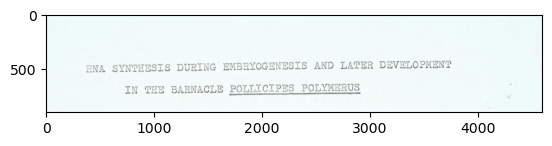

In [7]:
resized_cropped_img = cv2.resize(cropped_title, None, fx=2, fy=2)
print("Image size (H, W) once doubled:", resized_cropped_img.shape)
plt.imshow(resized_cropped_img)

## #2 Specify exact size of output image

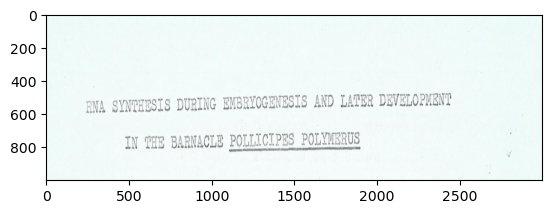

In [8]:
desired_width = 3000
desired_height = 1000
dim = (desired_width, desired_height)

resized_cropped_img2 = cv2.resize(cropped_title, dsize = dim, interpolation= cv2.INTER_AREA)
plt.imshow(resized_cropped_img2)

In [9]:
cv2.imwrite("./Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg", resized_cropped_img2)

True

## Converting to different Color Spaces

cv2.cvtColor() Converts an image from one color space to another. The function converts an input image from one color space to another. In case of a transformation to-from RGB color space, the order of the channels should be specified explicitly (RGB or BGR). Note that the default color format in OpenCV is often referred to as RGB but it is actually BGR (the bytes are reversed). So the first byte in a standard (24-bit) color image will be an 8-bit Blue component, the second byte will be Green, and the third byte will be Red. The fourth, fifth, and sixth bytes would then be the second pixel (Blue, then Green, then Red), and so on.

**Function Syntax**

```dst = cv2.cvtColor( src, code )```

- dst: Is the output image of the same size and depth as src.

The function has **2 required arguments**:

- src input image: 8-bit unsigned, 16-bit unsigned ( CV_16UC... ), or single-precision floating-point.

- code color space conversion code (see [ColorConversionCodes](https://docs.opencv.org/4.5.1/d8/d01/group__imgproc__color__conversions.html#ga4e0972be5de079fed4e3a10e24ef5ef0)).

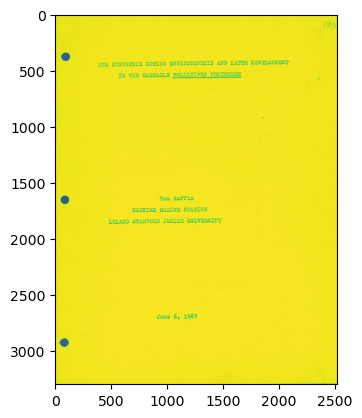

In [10]:
image_example = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0001.jpg")

gray = cv2.cvtColor(image_example, cv2.COLOR_BGR2GRAY)



plt.imshow(gray)

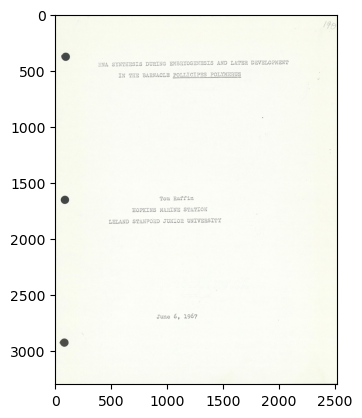

In [12]:
img_rgb = cv2.cvtColor(image_example, cv2.COLOR_BGR2RGB)

plt.imshow(img_rgb)

## Image Denoising in OpenCV

### Theory

- Denoising refers to the process of removing noise from an image, where noise is random variations in brightness or color that can obscure the underlying structure of the image. 
- Denoising is essential in various image processing tasks to improve the quality of images and enhance subsequent analysis or visualization.


OpenCV provides four variations of this technique:

1. **cv.fastNlMeansDenoising()** - works with a single grayscale images
2. **cv.fastNlMeansDenoisingColored()** - works with a color image.
3. **cv.fastNlMeansDenoisingMulti()** - works with image sequence captured in short period of time (grayscale images)
4. **cv.fastNlMeansDenoisingColoredMulti()** - same as above, but for color images.

**Function Syntax**

```denoised = cv2.fastNlMeansDenoising(src, None, h=10, templateWindowSize=7, searchWindowSize=21)```

- **src**: Imput image- should be an 8-bit or 16-bit single channel image
- **None**:  This parameter is a placeholder for the output denoised image. Since we want to obtain the denoised image as the output, we pass None, and the function will allocate memory for the output automatically.
- **h**: Parameter regulating filter strength. A larger h value leads to stronger denoising. Typically, h should be between 5 and 20. (10 is ok)
- A larger h value will result in stronger filtering, which means more noise reduction but also more potential blurring of edges and details in the image. Conversely, a smaller h value will result in weaker filtering, preserving more details but potentially leaving more noise in the image.
- **templateWindowSize**: size in pixels of the window used to compute the weighted average for a given pixel. It should be an odd value, typically in the range of 3 to 21. (recommended 7)
- **searchWindowSize**: Size in pixels of the window used to search for similar patches. It should be an odd value, typically larger than **templateWindowSize** (recommended 21)


**Purpose of each parameter**

- **h**: Controls the amount of denoising. Higher values of **"h"** will result in stronger denoising
- **templateWindowSize**: Determines the size of the pixel neighborhood used to compute the weighted average for denoising. **Larger values** will result in *smoother output but may remove finer details*.
- **searchWindowSize**: Determines the size of the neighborhood to search for similar patches. Larger values will consider a larger region for similarity, which may increase computational cost but can provide better denoising.

# *Run this line*

In [2]:
pytesseract.pytesseract.tesseract_cmd = r'C:\Users\aclao89\AppData\Local\\Programs\Tesseract-OCR\tesseract.exe'

### Adjust the H in Denoising

In [8]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=5, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h5 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h5

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h5 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 5:")
print(extracted_text_h5)


Extracted Text with Denoising H = 5:
BNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMEN

POLLICLPES POLY

4 Ge
| fo
Aan RYAN TE REL FE

TN THE BARNACLE MERUS




In [43]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=6, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h6 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h6

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h6 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 6:")
print(extracted_text_h6)


Extracted Text with Denoising H = 6:
BNA SYNTHESIS DURING BMBRLOGRUSSS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICE




In [46]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=7, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h7 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h7

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h7 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 7:")
print(extracted_text_h7)


Extracted Text with Denoising H = 7:
RNA SYNTHESIS DURING EM aRLOGENES 8 AND LATER DEVELOPMENT

IN THE BARNACLE POLLICTPES POLYIMBRUS




In [48]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=8, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h8 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h8

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h8 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 8:")
print(extracted_text_h8)


Extracted Text with Denoising H = 8:
RNA SYNTHESIS DURING ENBRYOGRNES 1S AND LATER DEVELOPMENT

IN THE BARNACLE &

nate Ine 5



In [47]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=9, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h9 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h9

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h9 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 9:")
print(extracted_text_h9)


Extracted Text with Denoising H = 9:
BWA, SYNTHESIS DURING ENBRYOGENESLS AND LATRR DEVELOPMENT

POLLICLPR: POL

+S; Sofueereho wees

IN THE BARNACLE YERUS




In [9]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h10 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h10

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h10 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 10:")
print(extracted_text_h10)


Extracted Text with Denoising H = 10:
4 SYNTHESIS DURING ENBRLOOSNESIS AND LATER DEVELOPMENT

IN THE BARNACLE P - POLYNERUS




In [10]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h15 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h15

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h15 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 15:")
print(extracted_text_h15)


Extracted Text with Denoising H = 15:
Bi, SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THE BARNACLE POLLUCLPES POLENERUS




In [11]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=20, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h20 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h20

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h20 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 20:")
print(extracted_text_h20)


Extracted Text with Denoising H = 20:
Ri, SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICIPES POLIMARUS

a et -



In [ ]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=21, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h21 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h21

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h21 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 21:")
print(extracted_text_h21)


In [51]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=22, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h22 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h22

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h22 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 22:")
print(extracted_text_h22)


Extracted Text with Denoising H = 22:
RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFIEN?

IN THE BARNACLE POLLICIPES POLINEAUS




In [52]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=23, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h23 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h23

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h23 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 23:")
print(extracted_text_h23)


Extracted Text with Denoising H = 23:
RNS SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFHENT

IN THE BARNACLE POLLIGIPRS POLYNERUS




In [53]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=24, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h24 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h24

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h24 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 24:")
print(extracted_text_h24)


Extracted Text with Denoising H = 24:
+

RNS SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFIEN?

—=

IN THE BARNACLE POLLUCIPES POLUIEAUS

i ime Sow




In [12]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=25, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h25 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h25

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h25 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 25:")
print(extracted_text_h25)


Extracted Text with Denoising H = 25:
——

RN, SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFEN?

enn

IN THE BARNACLE POLLICEPES POLI:



In [40]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=26, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h26 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h26

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h26 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 26:")
print(extracted_text_h26)


Extracted Text with Denoising H = 26:
——

RN, SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFHENT

IN THE BARNACLE POLLICIPRS POLYMERUS




In [42]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=27, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h27 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h27

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h27 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 27:")
print(extracted_text_h27)


Extracted Text with Denoising H = 27:
———

RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFIEN?

TN THR BARNACLE POLLICIPES POLYMERUS




In [13]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=28, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h28 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h28

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h28 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 28:")
print(extracted_text_h28)


Extracted Text with Denoising H = 28:
—

RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICIPRS POLYMERUS




In [14]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=30, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h30 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h30

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h30 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 30:")
print(extracted_text)


Extracted Text with Denoising H = 30:
BNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMEN

POLLICLPES POLY

4 Ge
| fo
Aan RYAN TE REL FE

TN THE BARNACLE MERUS




In [15]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=31, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h31 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h31

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h31 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 31:")
print(extracted_text_h31)


Extracted Text with Denoising H = 31:
RN, SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOFIENT

IN THE BARNACLE POLLUCIPES POLIMEAUS




In [16]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=32, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h32 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h32

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h32 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 32:")
print(extracted_text_h32)


Extracted Text with Denoising H = 32:
——

RNS SYNTHESIS DURING ENBRLOGENESS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICIPES POLYNERUS




In [63]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=19, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h19 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h19

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h19 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 19:")
print(extracted_text_h19)


Extracted Text with Denoising H = 19:
Ri, SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICIPES POLIMARUS




In [33]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=29, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text_h29 = pytesseract.image_to_string(resized_img)
    
    return extracted_text_h29

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text_h29 = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 29:")
print(extracted_text_h29)


Extracted Text with Denoising H = 29:
—

RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICTPES POLYMERUS

ina: Samant



In [65]:
# Open a text file in write mode
with open('Denoising Output H 5 - 32.txt', 'w') as file:
    # Write print statements to the file
    
    print("Denoising H = 5", file=file)
    print(extracted_text_h5, file=file)
    print("--------", file=file)
    print("Denoising H = 6", file=file)
    print(extracted_text_h6, file=file)
    print("--------", file=file)
    print("Denoising H = 7", file=file)
    print(extracted_text_h7, file=file)
    print("--------", file=file)
    print("Denoising H = 8", file=file)
    print(extracted_text_h8, file=file)
    print("--------", file=file)
    print("Denoising H = 9", file=file)
    print(extracted_text_h9, file=file)
    print("--------", file=file)
    print("Denoising H = 10", file=file)
    print(extracted_text_h10, file=file)
    print("--------", file=file)
    print("Denoising H = 15", file=file)
    print(extracted_text_h15, file=file)
    print("--------", file=file)
    print("Denoising H = 19", file=file)
    print(extracted_text_h19, file=file)
    print("--------", file=file)
    print("Denoising H = 20", file=file)
    print(extracted_text_h20, file=file)
    print("--------", file=file)
    print("Denoising H = 21", file=file)
    print(extracted_text_h21, file=file)
    print("--------", file=file)
    print("Denoising H = 22", file=file)
    print(extracted_text_h22, file=file)
    print("--------", file=file)
    print("Denoising H = 23", file=file)
    print(extracted_text_h23, file=file)
    print("--------", file=file)
    print("Denoising H = 24", file=file)
    print(extracted_text_h24, file=file)
    print("--------", file=file)
    print("Denoising H = 25", file=file)
    print(extracted_text_h25, file=file)
    print("--------", file=file)
    print("Denoising H = 26", file=file)
    print(extracted_text_h26, file=file)
    print("--------", file=file)
    print("Denoising H = 27", file=file)
    print(extracted_text_h27, file=file)
    print("--------", file=file)
    print("Denoising H = 28", file=file)
    print(extracted_text_h28, file=file)
    print("--------", file=file)
    print("Denoising H = 29", file=file)
    print(extracted_text_h29, file=file)
    print("--------", file=file)
    print("Denoising H = 30", file=file)
    print("--------", file=file)
    print(extracted_text_h30, file=file)
    print("Denoising H = 31", file=file)
    print(extracted_text_h31, file=file)
    print("--------", file=file)
    print("Denoising H = 32", file=file)
    print(extracted_text_h32, file=file)


## Denoising @ H = 28 & 29; manipulating templateWindowSize and searchWindowSize

In [79]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=28, templateWindowSize=7, searchWindowSize=19)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 28, templateWindowSize = 7, searchWindowSize = 19")
print(extracted_text)


Extracted Text with Denoising H = 28, templateWindowSize = 7, searchWindowSize = 19
——

RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THR BARNACLE POLLICIPES POLYNERUS




## Thresholding

- For every pixel, the same threshold value is applied. If the pixel value is smaller than the threshold, it is set to 0, otherwise it is set to a maximum value. 
- The function cv.threshold is used to apply the thresholding. 

### Basic Method for Global Threshold

- **cv2.threshold** function returns two values:
    - **retval**: The computed threshold values, which can be useful if the threshold method is adaptive
    - **dst**: The output binary image after applying thresholding

```retval, dst = cv2.threshold(src, thresh, maxval, type[, dst])```


- **src**: Input image, a single-channel (grayscale) image of type uint8 or float32.
- **thresh**: Threshold value. Pixel values greater than the threshold will be set to maxval, and values less than or equal to the threshold will be set to 0.
- **maxval**: Maximum value to use with the cv2.THRESH_BINARY and cv2.THRESH_BINARY_INV thresholding types. It is typically set to 255.
- **type**: Type of thresholding to apply. It can be one of the following:
    - **cv2.THRESH_BINARY**: Binary thresholding. Pixels with values greater than the threshold are set to maxval, and the rest are set to 0.
    - **cv2.THRESH_BINARY_INV**: Inverse binary thresholding. Pixels with values greater than the threshold are set to 0, and the rest are set to maxval.
    - **cv2.THRESH_TRUNC**: Truncated thresholding. Pixels with values greater than the threshold are set to the threshold value, and the rest remain unchanged.
    - **cv2.THRESH_TOZERO**: Thresholding to zero. Pixels with values less than the threshold are set to 0, and the rest remain unchanged.
    - **cv2.THRESH_TOZERO_INV**: Inverse thresholding to zero. Pixels with values greater than the threshold are set to 0, and the rest remain unchanged.
- dst (optional): Output image of the same size and type as the input image (src). If not specified, the function modifies the input image in place.


### Adaptive Threshold

```dst = cv2.adaptiveThreshold(src, maxValue, adaptiveMethod, thresholdType, blockSize, C[, dst])```

- **src**: input image

- Unlike ```cv2.threshold``` which uses a single global threshold value, ```cv2.adaptiveThreshold``` computes the threshold for each pixel based on the local neighborhood of the pixel.

- **adaptiveMethod** parameter specifies the method used to compute which can either:
    - ```cv2.ADAPTIVE_THRESH_MEAN_C```
    - ```cv2.ADAPTIVE_THRESH_GAUSSIAN_C```
    
- **blockSize**: determines the size of the local neighborhood for computing the threshold. Should be an odd number,  Since the neighborhood size must be symmetric around the pixel of interest, an odd blockSize ensures that there is a central pixel. If blockSize were even, there would be no exact center pixel, which could lead to complications in the computation.


- **c**: a constant subtracted from the mean or weighted mean calculated by the adaptive method. It adjusts the threshold value.


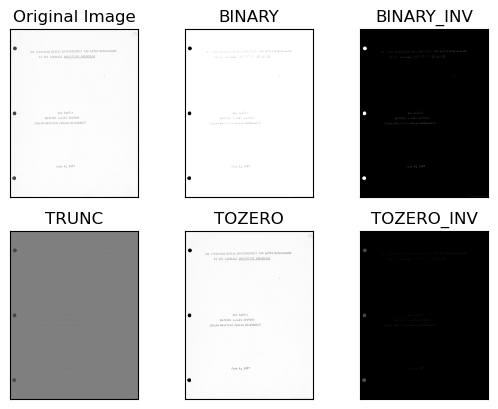

In [100]:
img = cv2.imread('./Fix OCR Papers/bg870mr8040/bg870mr8040_0001.jpg', cv2.IMREAD_GRAYSCALE)
# assert img is not None, "file could not be read, check with os.path.exists()"
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)
titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]
for i in range(6):
 plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
 plt.title(titles[i])
 plt.xticks([]),plt.yticks([])
plt.show()

## Adaptive Thresholding

#### Adjusting adaptiveMethod

In [80]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=28, templateWindowSize=7, searchWindowSize=19)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 30 & AdaptiveThreshold cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY:")
print(extracted_text)


Extracted Text with Denoising H = 30 & AdaptiveThreshold cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY:
——

RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THR BARNACLE POLLICIPES POLYNERUS




In [135]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising.
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=30, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001-cropped.jpg'
extracted_text = enhance_ocr_quality(image_path)
print("Extracted Text with Denoising H = 30 & cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY :")
print(extracted_text)


Extracted Text with Denoising H = 30 & cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY :
Rid SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMENT

IN THE BARNACLE POLLICIPES POLYMERUS



In [43]:
raw_image = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0002.jp2")


# bg870mr8040_0002.jpg Side by Side Comparison

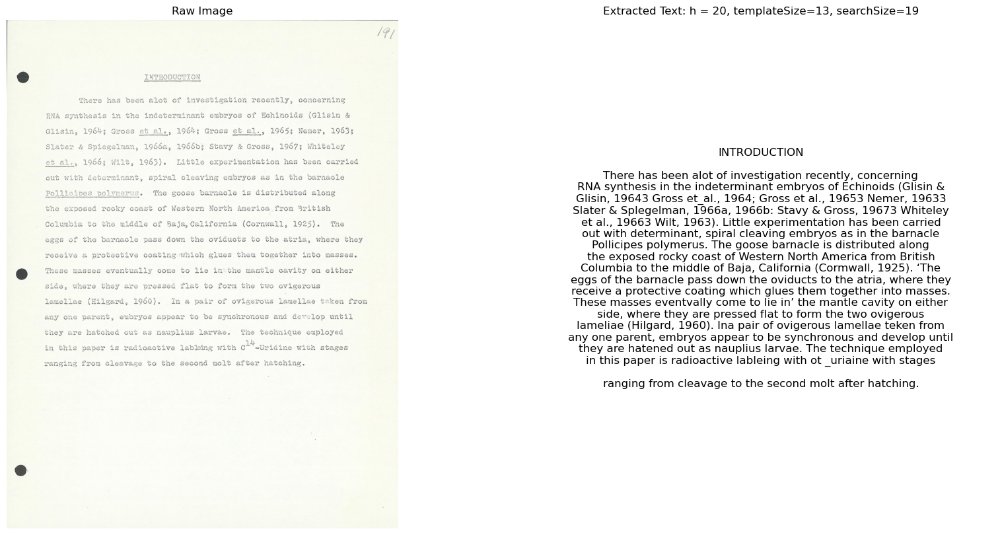

In [180]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.h=20, template=13
    denoised = cv2.fastNlMeansDenoising(gray, None, h=20, templateWindowSize=13, searchWindowSize=19)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0002.jpg'
extracted_text_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 20, templateSize=13, searchSize=19')
plt.axis('off')

# Save the combined display as an image file
# plt.savefig('./Fix OCR Papers/bg870mr8040/output_folder/bg870mr8040_0002_sidebyside.jpg')

plt.show()


In [40]:
raw_bg870mr8040_0002_jp2 = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0002.jp2")


In [38]:
raw_bg870mr8040_0003_jp2 = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0003.jp2")

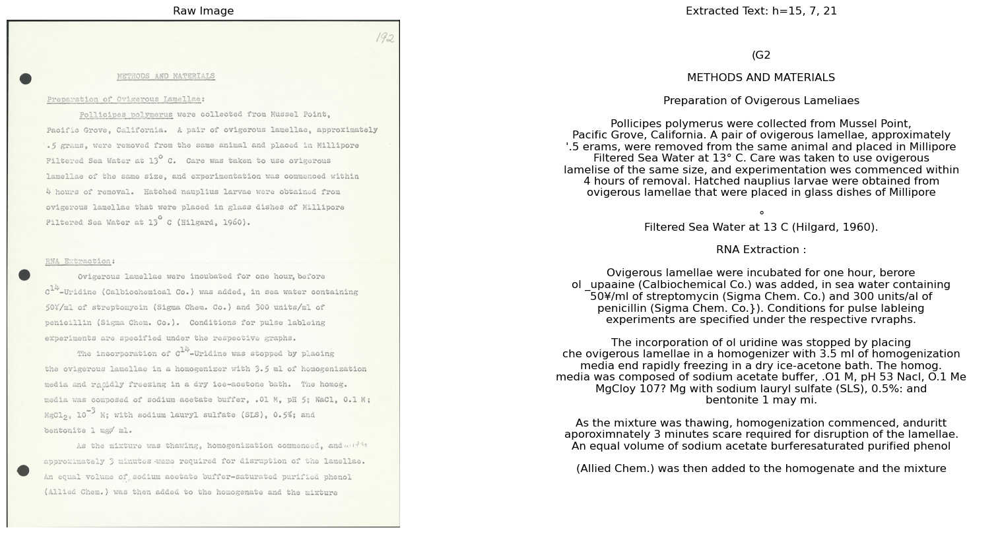

In [50]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0003.jp2'
extracted_text__003_jpg = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bg870mr8040_0003_jpg, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text__003_jpg, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h=15, 7, 21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bg870mr8040/output_folder/bg870mr8040_0003_sidebyside.jpg')


plt.show()


In [5]:
raw_bg870mr8040_0004_jp2 = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0004.jp2")
raw_bg870mr8040_0005_jp2 = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0005.jp2")
raw_bg870mr8040_0006_jp2 = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0006.jp2")
raw_bg870mr8040_0007_jp2 = cv2.imread("./Fix OCR Papers/bg870mr8040/bg870mr8040_0007.jp2")



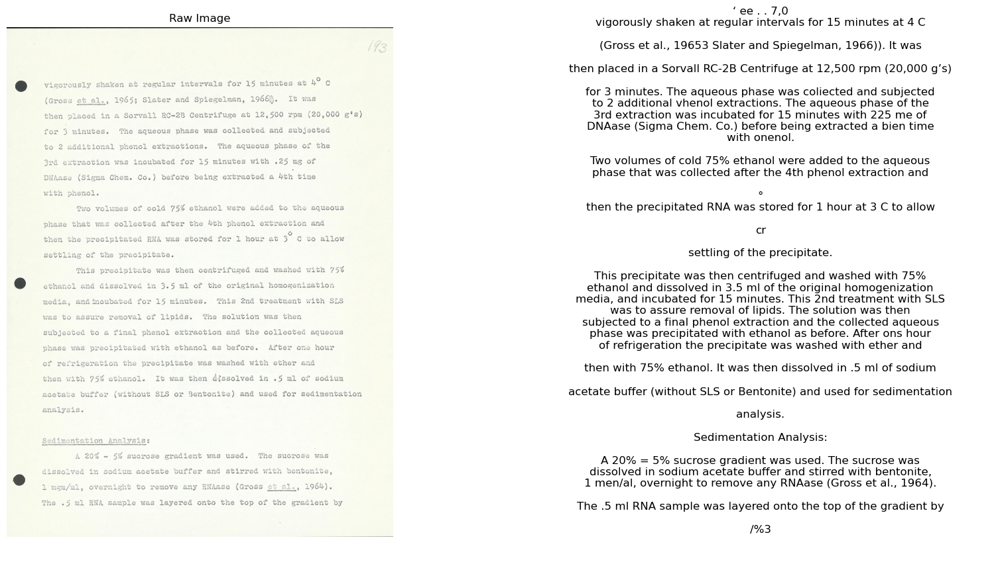

In [34]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0004.jp2'
extracted_text__004_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bg870mr8040_0004_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text__004_jp2, fontsize=12, ha='center', va='center')
# plt.title('Extracted Text: h = 15, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bg870mr8040/output_folder/bg870mr8040_0004_sidebyside.jpg')


plt.show()


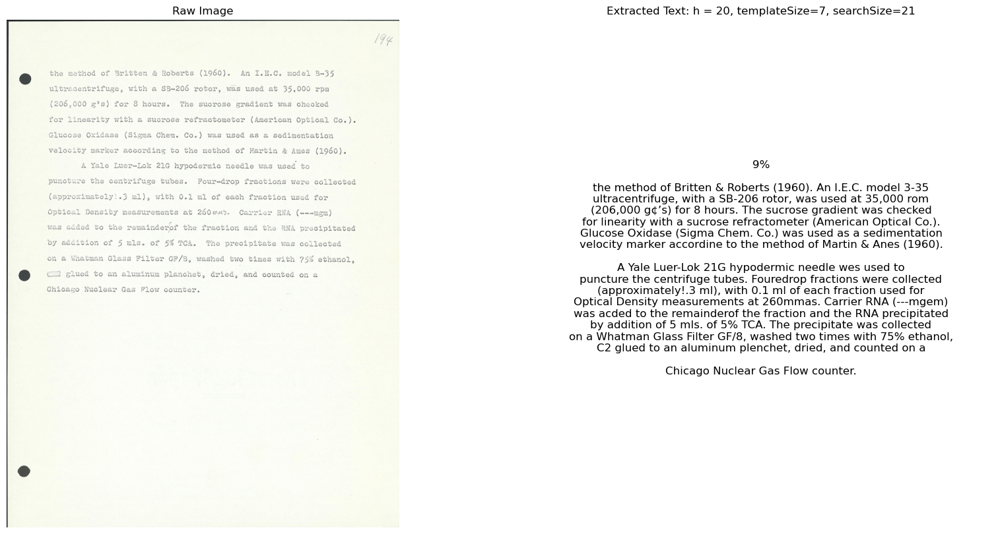

In [24]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=20, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0005.jp2'
extracted_text__005_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bg870mr8040_0005_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text__005_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 20, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bg870mr8040/output_folder/bg870mr8040_0005_sidebyside.jpg')

plt.show()


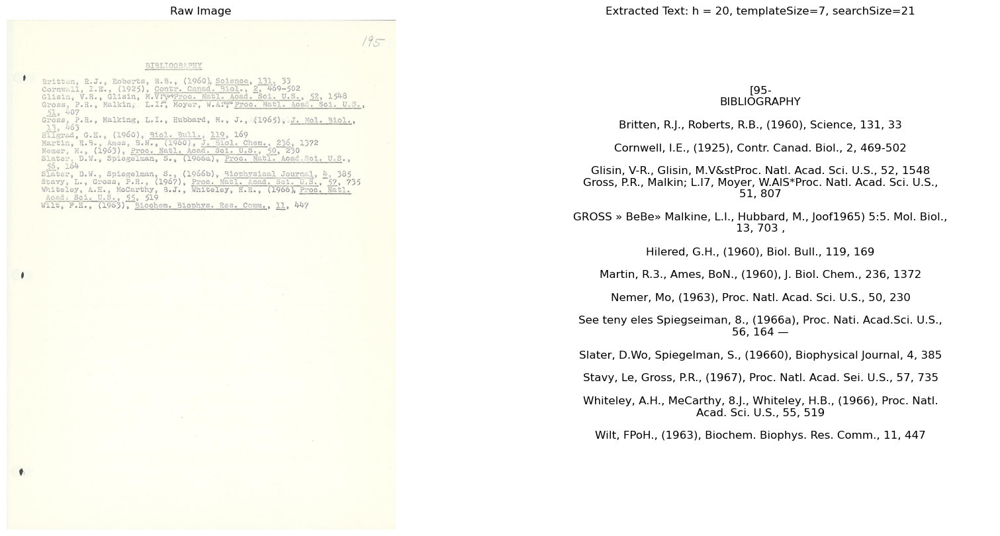

In [23]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=20, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0006.jp2'
extracted_text__006_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bg870mr8040_0006_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text__006_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 20, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bg870mr8040/output_folder/bg870mr8040_0006_sidebyside.jpg')

plt.show()


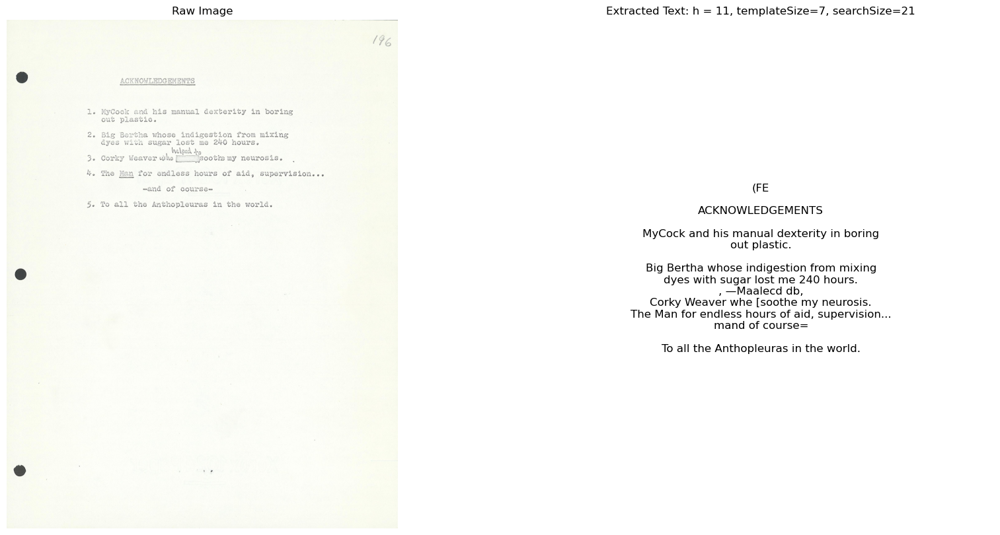

In [65]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 11, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0007.jp2'
extracted_text__006_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bg870mr8040_0007_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text__006_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 11, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bg870mr8040/output_folder/bg870mr8040_0007_sidebyside.jpg')

plt.show()


# bj170wc5114

In [66]:
raw_bj170wc5114_0001_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0001.jp2")
raw_bj170wc5114_0002_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0002.jp2")
raw_bj170wc5114_0003_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0003.jp2")
raw_bj170wc5114_0004_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0004.jp2")
raw_bj170wc5114_0005_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0005.jp2")
raw_bj170wc5114_0006_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0006.jp2")
raw_bj170wc5114_0007_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0007.jp2")
raw_bj170wc5114_0008_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0008.jp2")
raw_bj170wc5114_0009_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0009.jp2")
raw_bj170wc5114_0010_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0010.jp2")
raw_bj170wc5114_0011_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0011.jp2")
raw_bj170wc5114_0012_jp2 = cv2.imread("./Fix OCR Papers/bj170wc5114/bj170wc5114_0012.jp2")


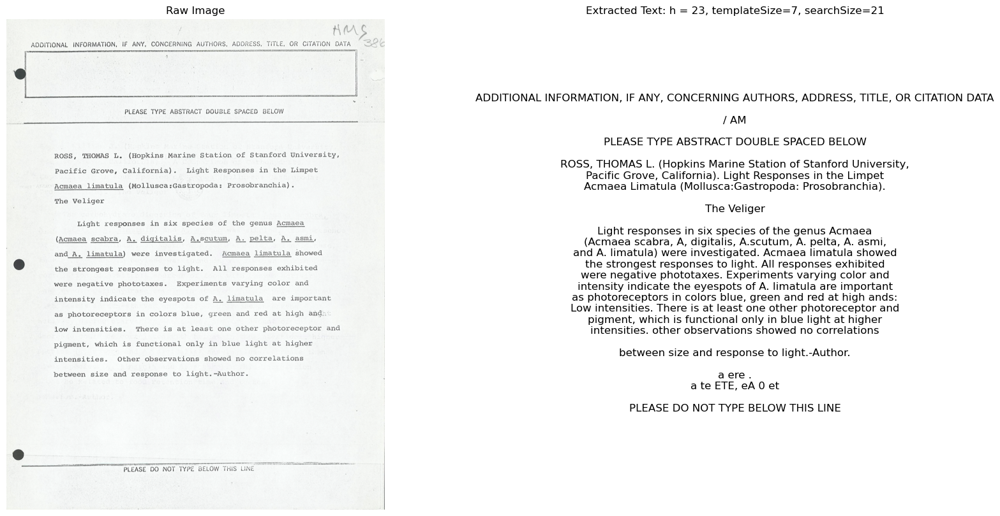

In [77]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 23, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0001.jp2'
extracted_text_bj170wc5114_0001_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0001_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0001_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 23, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0001_sidebyside.jpg')

plt.show()


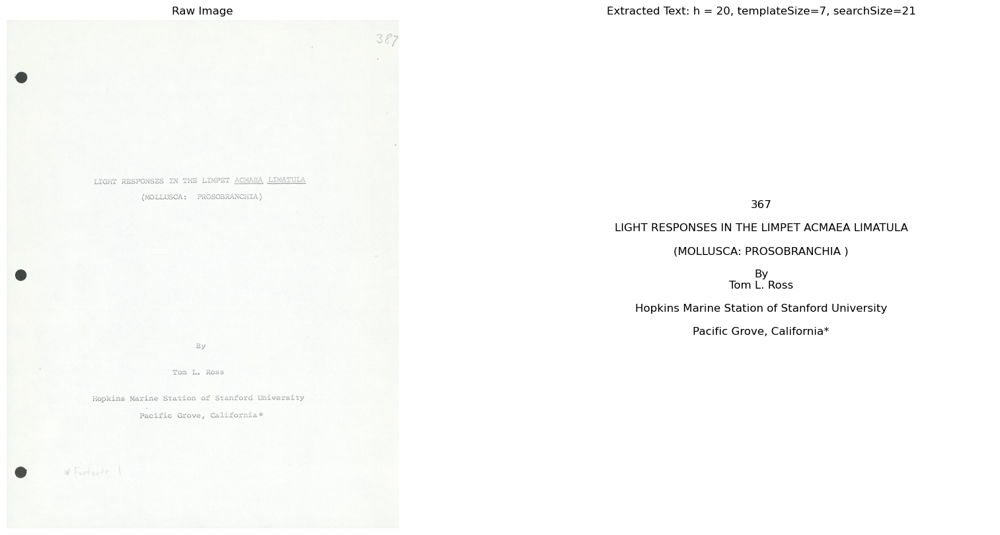

In [83]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 20, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0002.jp2'
extracted_text_bj170wc5114_0002_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0002_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0002_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 20, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0002_sidebyside.jpg')

plt.show()


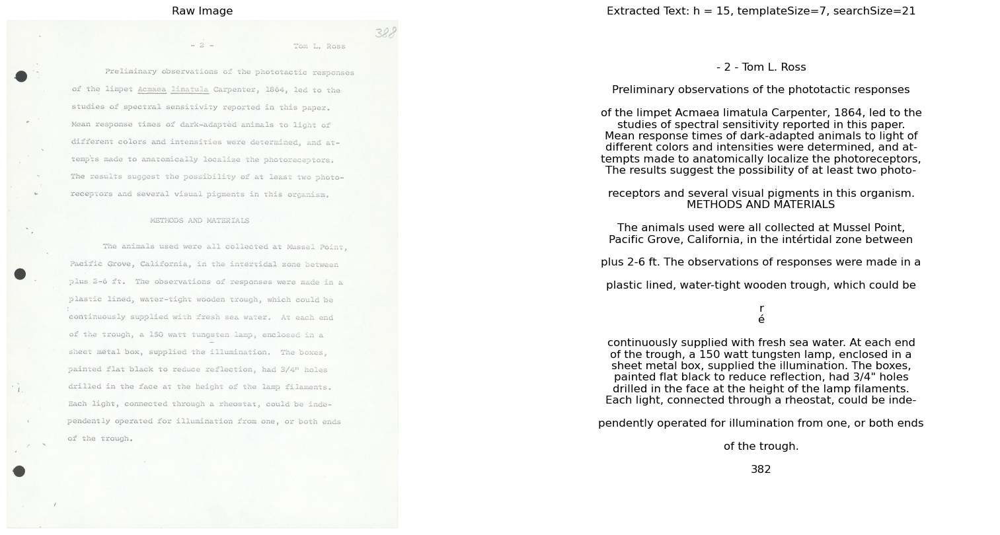

In [91]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0003.jp2'
extracted_text_bj170wc5114_0003_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0003_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0003_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 15, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0003_sidebyside.jpg')

plt.show()


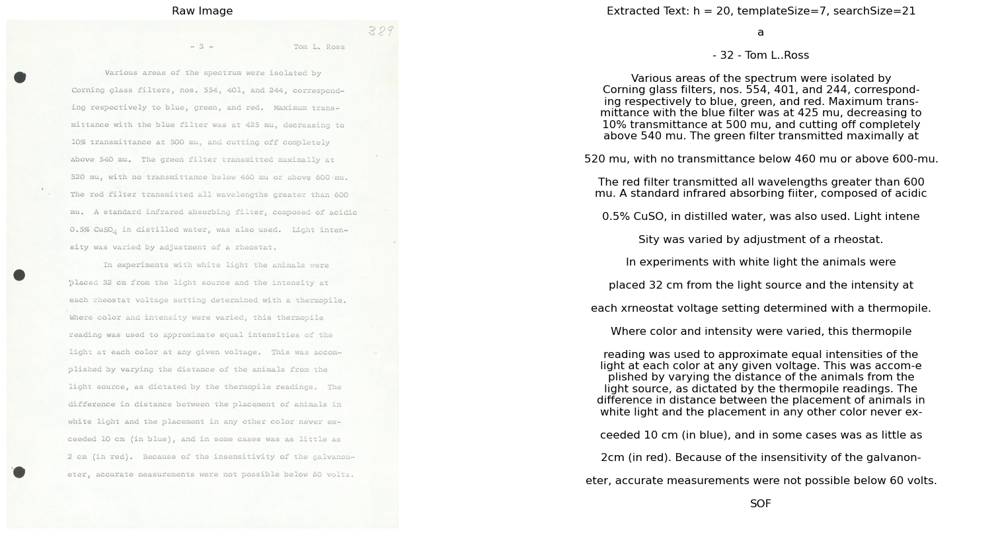

In [97]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0004.jp2'
extracted_text_bj170wc5114_0004_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0004_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0004_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 20, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0004_sidebyside.jpg')

plt.show()


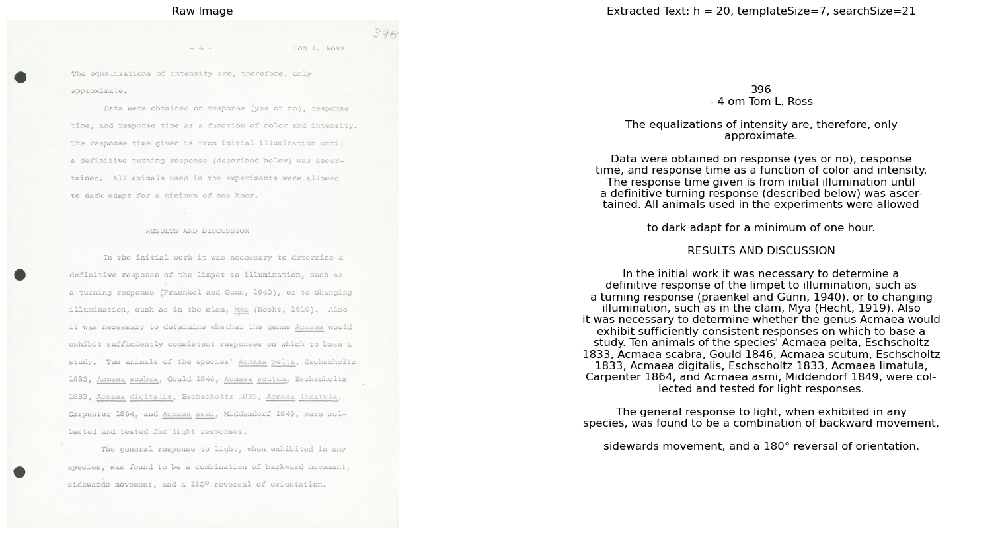

In [100]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0005.jp2'
extracted_text_bj170wc5114_0005_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0005_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0005_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 20, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0005_sidebyside.jpg')

plt.show()


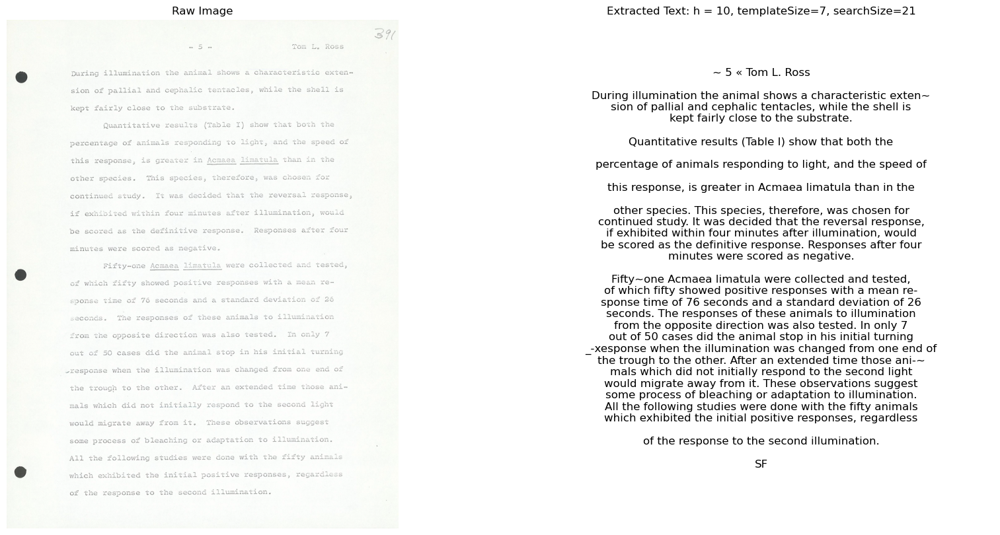

In [107]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0006.jp2'
extracted_text_bj170wc5114_0006_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0006_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0006_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 10, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0006_sidebyside.jpg')

plt.show()


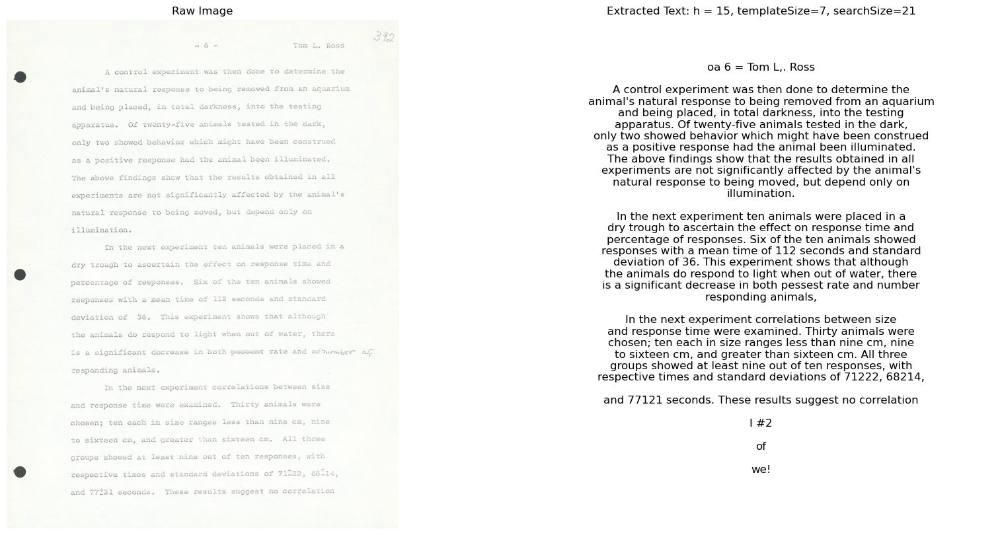

In [113]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0007.jp2'
extracted_text_bj170wc5114_0007_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0007_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0007_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 15, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0007_sidebyside.jpg')

plt.show()


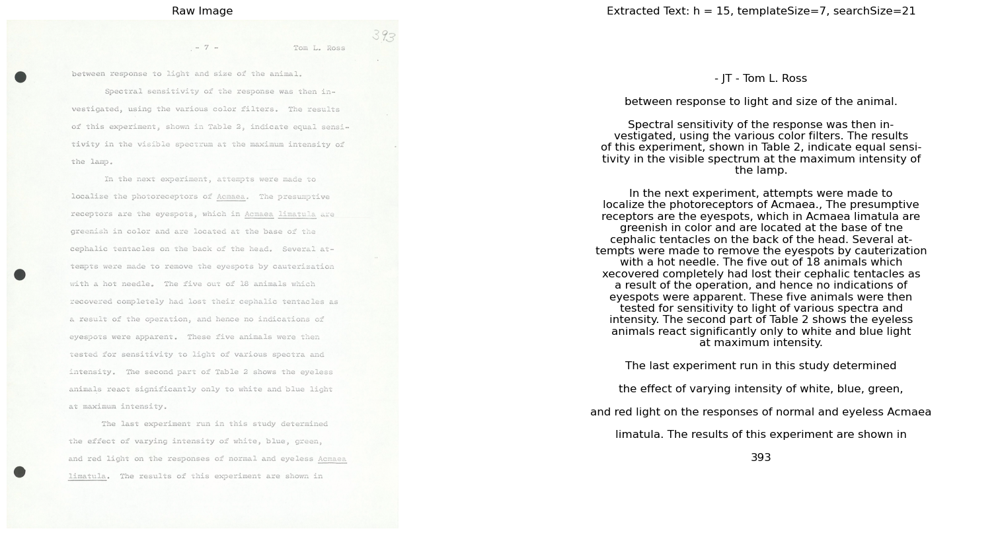

In [115]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0008.jp2'
extracted_text_bj170wc5114_0008_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0008_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0008_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 15, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0008_sidebyside.jpg')

plt.show()


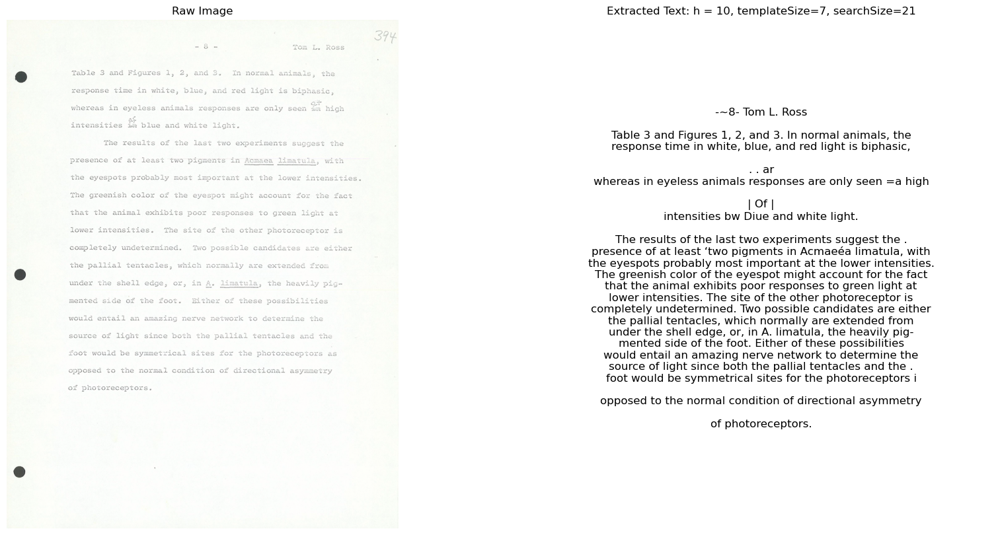

In [120]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0009.jp2'
extracted_text_bj170wc5114_0009_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0009_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0009_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 10, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_0009_sidebyside.jpg')

plt.show()


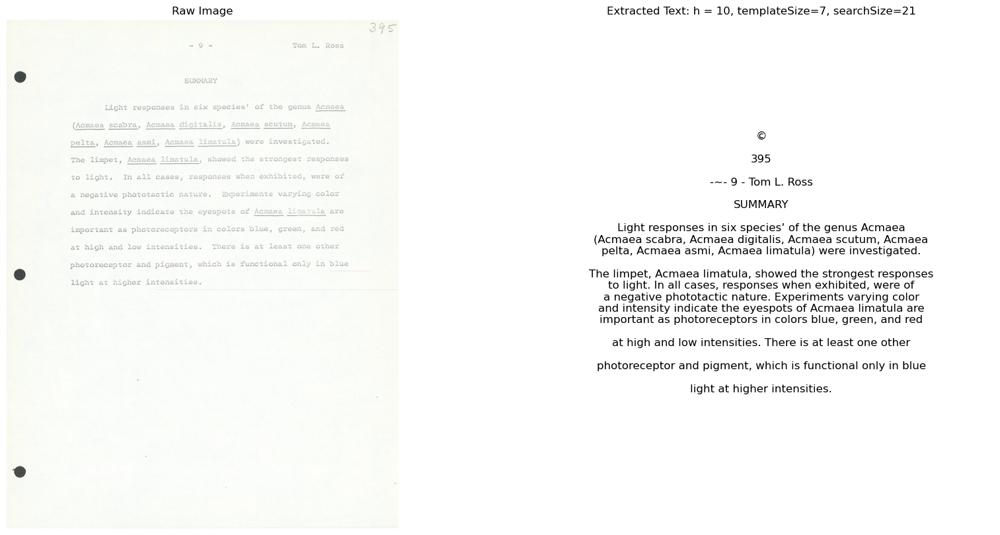

In [122]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0010.jp2'
extracted_text_bj170wc5114_0010_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0010_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0010_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 10, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_00010_sidebyside.jpg')

plt.show()


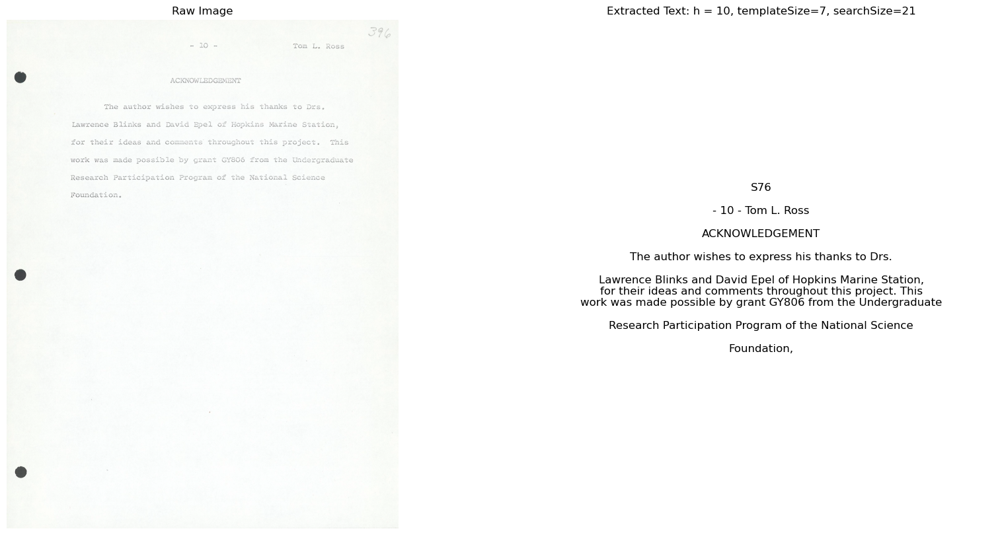

In [124]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0011.jp2'
extracted_text_bj170wc5114_0011_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0011_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0011_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 10, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_00011_sidebyside.jpg')

plt.show()


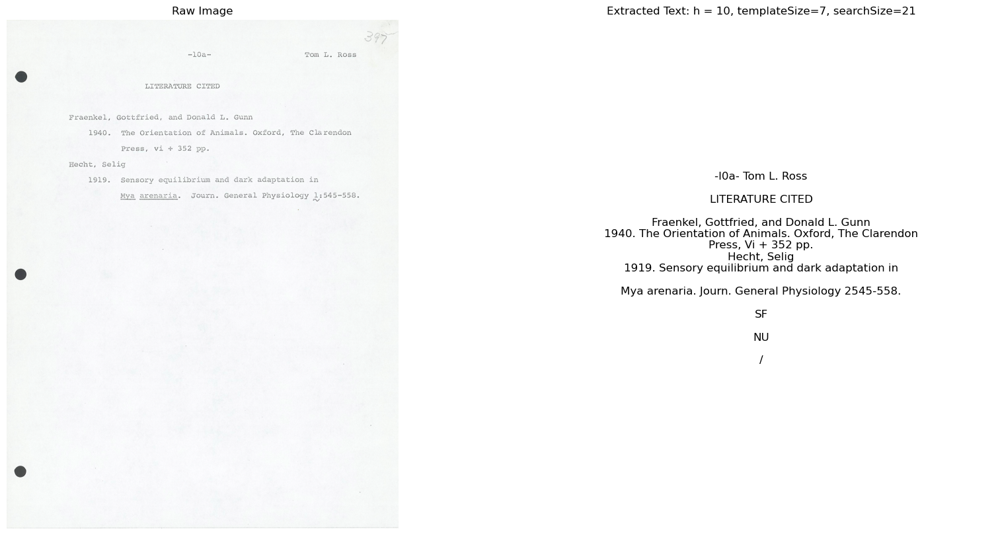

In [128]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h= 15, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. 
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bj170wc5114/bj170wc5114_0012.jp2'
extracted_text_bj170wc5114_0012_jp2 = enhance_ocr_quality(image_path)
# print("Extracted Text:")
# print(extracted_text)

# Step 3: Display the raw image and extracted text
plt.figure(figsize=(20, 10))

# Display the raw image
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(raw_bj170wc5114_0012_jp2, cv2.COLOR_BGR2RGB))
plt.title('Raw Image')
plt.axis('off')

# Display the extracted text
plt.subplot(1, 2, 2)
plt.text(0.5, 0.5, extracted_text_bj170wc5114_0012_jp2, fontsize=12, ha='center', va='center')
plt.title('Extracted Text: h = 10, templateSize=7, searchSize=21')
plt.axis('off')

plt.savefig('./Fix OCR Papers/bj170wc5114/output_folder/bj170wc5114_00012_sidebyside.jpg')

plt.show()


## Read in Directory of Images - ch792bx6307

In [35]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/ch792bx6307/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h10\ch792bx6307_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/ch792bx6307/output_h1

## Read in Directory of Images - cj258ns3486

In [38]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=20, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h20')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/cj258ns3486/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h20\cj258ns3486_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/cj258ns3486/output_h2

## Read in Directory of Images - dj224jp8743

In [41]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/dj224jp8743/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h10\dj224jp8743_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dj224jp8743/output_h1

ValueError: 
$$0
^
ParseException: Expected end of text, found '$'  (at char 0), (line:1, col:1)

Error in callback <function _draw_all_if_interactive at 0x000001D7D439FB00> (for post_execute):


ValueError: 
$$0
^
ParseException: Expected end of text, found '$'  (at char 0), (line:1, col:1)

ValueError: 
$$0
^
ParseException: Expected end of text, found '$'  (at char 0), (line:1, col:1)

<Figure size 2000x1000 with 2 Axes>

## Read in Directory of Images - dq995jh3669

In [44]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=20, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h20')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/dq995jh3669/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/dq995jh3669/output_h20\dq995jh3669_0010_sidebyside.jpg


## Read in Directory of Images - fy246vw6211

In [47]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/fy246vw6211/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h10\fy246vw6211_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/fy246vw6211/output_h1

## Read in Directory of Images - gp441gd9761

In [50]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/gp441gd9761/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h10\gp441gd9761_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gp441gd9761/output_h1

## Read in Directory of Images - gv579hx3954

In [59]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/gv579hx3954/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h10\gv579hx3954_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gv579hx3954/output_h1

## Read in Directory of Images - gx021jv8425

In [56]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/gx021jv8425/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h10\gx021jv8425_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gx021jv8425/output_h1

## Read in Directory of Images - gz293yq4738


In [60]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text, image

def process_images_in_folder(folder_path):
    # Ensure the folder path exists
    if not os.path.exists(folder_path):
        print(f"Error: The folder {folder_path} does not exist.")
        return
    
    # Create an output directory if it doesn't exist
    output_dir = os.path.join(folder_path, 'output_h10')
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Loop through all .jpg files in the specified folder
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg'):
            image_path = os.path.join(folder_path, filename)
            
            # Enhance OCR quality and get the raw image
            extracted_text, raw_image = enhance_ocr_quality(image_path)
            
            # Prepare the output file names
            base_filename = os.path.splitext(filename)[0]
            output_image_path = os.path.join(output_dir, f"{base_filename}_sidebyside.jpg")
            
            # Display and save the raw image and extracted text
            plt.figure(figsize=(20, 10))

            # Display the raw image
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(raw_image, cv2.COLOR_BGR2RGB))
            plt.title('Raw Image')
            plt.axis('off')

            # Display the extracted text
            plt.subplot(1, 2, 2)
            plt.text(0.5, 0.5, extracted_text, fontsize=12, ha='center', va='center')
            plt.title('Extracted Text')
            plt.axis('off')

            # Save the side-by-side image
            plt.savefig(output_image_path)
            plt.close()

            print(f"Processed and saved: {output_image_path}")

# Example usage:
folder_path = '../Fix OCR Papers/gz293yq4738/'
process_images_in_folder(folder_path)


Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0001_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0002_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0003_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0004_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0005_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0006_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0007_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0008_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0009_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h10\gz293yq4738_0010_sidebyside.jpg
Processed and saved: ../Fix OCR Papers/gz293yq4738/output_h1

In [ ]:
def enhance_ocr_quality(image_path, h_range, template_range, search_range):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    results = {}
    
    # Loop over h_range, template_range, and search_range
    for h in h_range:
        for template_size in template_range:
            for search_size in search_range:
                # Apply image denoising
                denoised = cv2.fastNlMeansDenoising(gray, None, h=h, templateWindowSize=template_size, searchWindowSize=search_size)
                
                # Apply adaptive thresholding to binarize the image
                threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
                
                # Resize image to improve OCR accuracy and speed
                resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
                
                # Perform OCR using PyTesseract
                extracted_text = pytesseract.image_to_string(resized_img)
                
                # Store the extracted text along with the parameters used
                results[(h, template_size, search_size)] = extracted_text
    
    return results

# Define parameter ranges
h_range = list(range(10, 20))
template_range = [size for size in range(7, 12) if size % 2 != 0]
search_range = [size for size in range(17, 23) if size % 2 != 0]

# Folder containing .jp2 files
folder_path = './Fix OCR Papers/bg870mr8040/'

# Get list of .jp2 file paths
jp2_files = glob.glob(os.path.join(folder_path, '*.jp2'))

# Iterate through each .jp2 file
for jp2_file in jp2_files:
    # Extract file name for distinction purposes
    file_name = os.path.splitext(os.path.basename(jp2_file))[0]
    
    # Perform OCR quality enhancement
    results = enhance_ocr_quality(jp2_file, h_range, template_range, search_range)
    
    # Display the original image and extracted text side by side
    plt.figure(figsize=(20, 10))
    
    # Display the original image
    original_image = cv2.imread(jp2_file)
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Display the extracted text with parameter values
    plt.subplot(1, 2, 2)
    extracted_text = ''
    for params, text in results.items():
        h, template_size, search_size = params
        extracted_text += f'h={h}, tw={template_size}, sw={search_size}:\n{text}\n\n'
    plt.text(0.05, 0.95, extracted_text, fontsize=12, ha='left', va='top')
    plt.title('Extracted Text with Parameters')
    plt.axis('off')
    
    # Save the combined display as an image file with abbreviated file name
    abbreviated_name = '_'.join(file_name.split('_')[:2])
    plt.savefig(f'{abbreviated_name}_combined_img_text.jpg')
    print(f"Combined image with extracted text for {file_name} saved as '{abbreviated_name}_combined_img_text.jpg'")
    
    plt.close()


In [4]:
def enhance_ocr_quality(image_path, h_range, template_range, search_range):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    results = {}
    
    # Loop over h_range, template_range, and search_range
    for h in h_range:
        for template_size in template_range:
            for search_size in search_range:
                # Apply image denoising
                denoised = cv2.fastNlMeansDenoising(gray, None, h=h, templateWindowSize=template_size, searchWindowSize=search_size)
                
                # Apply adaptive thresholding to binarize the image
                threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
                
                # Resize image to improve OCR accuracy and speed
                resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
                
                # Perform OCR using PyTesseract
                extracted_text = pytesseract.image_to_string(resized_img)
                
                # Store the extracted text along with the parameters used
                results[(h, template_size, search_size)] = extracted_text
    
    return results

# Define parameter ranges
h_range = list(range(10, 20))
template_range = [size for size in range(7, 12) if size % 2 != 0]
search_range = [size for size in range(17, 23) if size % 2 != 0]

# Folder containing .jp2 files
folder_path = './Fix OCR Papers/bg870mr8040/'

# Get list of .jp2 file paths
jp2_files = glob.glob(os.path.join(folder_path, '*.jp2'))

# Iterate through each .jp2 file
for jp2_file in jp2_files:
    # Extract file name for distinction purposes
    file_name = os.path.splitext(os.path.basename(jp2_file))[0]
    
    # Perform OCR quality enhancement
    results = enhance_ocr_quality(jp2_file, h_range, template_range, search_range)
    
    # Display the original image and extracted text side by side
    plt.figure(figsize=(20, 10))
    
    # Display the original image
    original_image = cv2.imread(jp2_file)
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    # Display the extracted text with parameter values
    plt.subplot(1, 2, 2)
    extracted_text = ''
    for params, text in results.items():
        h, template_size, search_size = params
        extracted_text += f'h={h}, tw={template_size}, sw={search_size}:\n{text}\n\n'
    plt.text(0.05, 0.95, extracted_text, fontsize=12, ha='left', va='top')
    plt.title('Extracted Text with Parameters')
    plt.axis('off')
    
    # Save the combined display as an image file with abbreviated file name
    abbreviated_name = '_'.join(file_name.split('_')[:2])
    plt.savefig(f'{abbreviated_name}_combined_img_text.jpg')
    print(f"Combined image with extracted text for {file_name} saved as '{abbreviated_name}_combined_img_text.jpg'")
    
    plt.close()


Combined image with extracted text for bg870mr8040_0001 saved as 'bg870mr8040_0001_combined_img_text.jpg'
Combined image with extracted text for bg870mr8040_0002 saved as 'bg870mr8040_0002_combined_img_text.jpg'
Combined image with extracted text for bg870mr8040_0003 saved as 'bg870mr8040_0003_combined_img_text.jpg'
Combined image with extracted text for bg870mr8040_0004 saved as 'bg870mr8040_0004_combined_img_text.jpg'
Combined image with extracted text for bg870mr8040_0005 saved as 'bg870mr8040_0005_combined_img_text.jpg'
Combined image with extracted text for bg870mr8040_0006 saved as 'bg870mr8040_0006_combined_img_text.jpg'
Combined image with extracted text for bg870mr8040_0007 saved as 'bg870mr8040_0007_combined_img_text.jpg'


In [15]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    '''By denoising the image before applying adaptive thresholding, we aim to enhance the quality of the image 
    by reducing noise, which can improve the accuracy of the thresholding process. This can lead to better 
    segmentation of the foreground (text) from the background.'''
    
    #Apply image denoising. 
    #Noise is a random variation of brightness or color in an image, it is usually added when we scan documents.
    denoised = cv2.fastNlMeansDenoising(gray, None, h=30, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image. This converts the image to black and white only.
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0001.jp2'
extracted_text = enhance_ocr_quality(image_path)
print("Extracted Text:")
print(extracted_text)


Extracted Text:
©

RNA SYNTHESIS DURING EMBRYOGENESIS AND LATER DEVELOPMBNT

IN THE BARNACLE POLLICIPHS POLYMERUS

Tom Raffin
HOPKINS MARINE STATION

LELAND STANFORD JUNIOR UNIVERSITY

Sune 6, 1967

96




In [16]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=30, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0007.jpg'
extracted_text = enhance_ocr_quality(image_path)
print("Extracted Text:")
print(extracted_text)


Extracted Text:
3.6
Ly.

(FE

ACKNOWLEDGEMENTS

MyCock and his manuel dexterity in boring
out plastic.
Blige Bertha whose indigestion from mixing
Gyes with sugar lost me 240 hours.
Welncd do
Corky Weaver who(l_ soothe my neurosis.
The Men for endless hours of aid, supervision...
mand of course=

To atl tne Anthoplcuras in the world.



In [17]:
def enhance_ocr_quality(image_path):
    # Read the image
    image = cv2.imread(image_path)
    
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Apply image denoising
    denoised = cv2.fastNlMeansDenoising(gray, None, h=30, templateWindowSize=7, searchWindowSize=21)
    
    # Apply adaptive thresholding to binarize the image
    threshold_img = cv2.adaptiveThreshold(denoised, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    
    # Resize image to improve OCR accuracy and speed
    resized_img = cv2.resize(threshold_img, None, fx=1.5, fy=1.5, interpolation=cv2.INTER_CUBIC)
        
    # Perform OCR using PyTesseract
    extracted_text = pytesseract.image_to_string(resized_img)
    
    return extracted_text

# Example usage:
image_path = './Fix OCR Papers/bg870mr8040/bg870mr8040_0007.jpg'
extracted_text = enhance_ocr_quality(image_path)
print("Extracted Text:")
print(extracted_text)


Extracted Text:
3 0
Ly,

(GE

ACKNOWLEDGEMENTS

MyCock and his manuel dexterity in boring
out plastic.
Big Bertha whose indigestion from mixing
éyes wivta sugar lost me 240 hours.
helped +o .
Corky Weaver who soothe my neurosis.
The Men for endless hours of aid, supervision...
“and of course=

To all the Anthopleures in the world.

